In [211]:
import pandas as pd
import  matplotlib.pyplot as plt

In [212]:
# Load CSV into DataFrame
df1 = pd.read_csv('user_reviews.csv')
df2 = pd.read_csv('apps.csv')

In [213]:
df1

,App,Translated_Review,Sentiment,Sentiment_Polarity,Sentiment_Subjectivity
0,10 Best Foods for You,I like eat delicious food. That's I'm cooking ...,Positive,1.00,0.533333
1,10 Best Foods for You,This help eating healthy exercise regular basis,Positive,0.25,0.288462
2,10 Best Foods for You,NaN,NaN,NaN,NaN
3,10 Best Foods for You,Works great especially going grocery store,Positive,0.40,0.875000
4,10 Best Foods for You,Best idea us,Positive,1.00,0.300000
...,...,...,...,...,...
64290,Houzz Interior Design Ideas,NaN,NaN,NaN,NaN
64291,Houzz Interior Design Ideas,NaN,NaN,NaN,NaN
64292,Houzz Interior Design Ideas,NaN,NaN,NaN,NaN
64293,Houzz Interior Design Ideas,NaN,NaN,NaN,NaN


In [214]:
df2

,Unnamed: 0,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19.0,"10,000+",Free,0,Everyone,Art & Design,"January 7, 2018",1.0.0,4.0.3 and up
1,1,Coloring book moana,ART_AND_DESIGN,3.9,967,14.0,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
2,2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7,"5,000,000+",Free,0,Everyone,Art & Design,"August 1, 2018",1.2.4,4.0.3 and up
3,3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25.0,"50,000,000+",Free,0,Teen,Art & Design,"June 8, 2018",Varies with device,4.2 and up
4,4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8,"100,000+",Free,0,Everyone,Art & Design;Creativity,"June 20, 2018",1.1,4.4 and up
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9654,10836,Sya9a Maroc - FR,FAMILY,4.5,38,53.0,"5,000+",Free,0,Everyone,Education,"July 25, 2017",1.48,4.1 and up
9655,10837,Fr. Mike Schmitz Audio Teachings,FAMILY,5.0,4,3.6,100+,Free,0,Everyone,Education,"July 6, 2018",1,4.1 and up
9656,10838,Parkinson Exercices FR,MEDICAL,NaN,3,9.5,"1,000+",Free,0,Everyone,Medical,"January 20, 2017",1,2.2 and up
9657,10839,The SCP Foundation DB fr nn5n,BOOKS_AND_REFERENCE,4.5,114,NaN,"1,000+",Free,0,Mature 17+,Books & Reference,"January 19, 2015",Varies with device,Varies with device


In [215]:
## both dataframes have a common column i.e the App column. So i'm going to merge these two dataframes into one using the App column
df = pd.merge(df1, df2, on='App', how='right')

In [216]:
df

,App,Translated_Review,Sentiment,Sentiment_Polarity,Sentiment_Subjectivity,Unnamed: 0,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,NaN,NaN,NaN,NaN,0,ART_AND_DESIGN,4.1,159,19.0,"10,000+",Free,0,Everyone,Art & Design,"January 7, 2018",1.0.0,4.0.3 and up
1,Coloring book moana,A kid's excessive ads. The types ads allowed a...,Negative,-0.250,1.000000,1,ART_AND_DESIGN,3.9,967,14.0,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
2,Coloring book moana,It bad >:(,Negative,-0.725,0.833333,1,ART_AND_DESIGN,3.9,967,14.0,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
3,Coloring book moana,like,Neutral,0.000,0.000000,1,ART_AND_DESIGN,3.9,967,14.0,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
4,Coloring book moana,NaN,NaN,NaN,NaN,1,ART_AND_DESIGN,3.9,967,14.0,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70190,Sya9a Maroc - FR,NaN,NaN,NaN,NaN,10836,FAMILY,4.5,38,53.0,"5,000+",Free,0,Everyone,Education,"July 25, 2017",1.48,4.1 and up
70191,Fr. Mike Schmitz Audio Teachings,NaN,NaN,NaN,NaN,10837,FAMILY,5.0,4,3.6,100+,Free,0,Everyone,Education,"July 6, 2018",1,4.1 and up
70192,Parkinson Exercices FR,NaN,NaN,NaN,NaN,10838,MEDICAL,NaN,3,9.5,"1,000+",Free,0,Everyone,Medical,"January 20, 2017",1,2.2 and up
70193,The SCP Foundation DB fr nn5n,NaN,NaN,NaN,NaN,10839,BOOKS_AND_REFERENCE,4.5,114,NaN,"1,000+",Free,0,Mature 17+,Books & Reference,"January 19, 2015",Varies with device,Varies with device


In [217]:
# Check data types of all columns
print(df.dtypes)

App                        object
Translated_Review          object
Sentiment                  object
Sentiment_Polarity        float64
Sentiment_Subjectivity    float64
Unnamed: 0                  int64
Category                   object
Rating                    float64
Reviews                     int64
Size                      float64
Installs                   object
Type                       object
Price                      object
Content Rating             object
Genres                     object
Last Updated               object
Current Ver                object
Android Ver                object
dtype: object


In [218]:
# Check for missing values
missing_values = df.isnull().sum()

# Print the columns with missing values
print("Missing values in each column:")
print(missing_values)

Missing values in each column:
App                           0
Translated_Review         34266
Sentiment                 34261
Sentiment_Polarity        34261
Sentiment_Subjectivity    34261
Unnamed: 0                    0
Category                      0
Rating                     1463
Reviews                       0
Size                      21331
Installs                      0
Type                          0
Price                         0
Content Rating                0
Genres                        0
Last Updated                  0
Current Ver                   8
Android Ver                   2
dtype: int64


In [219]:
# Impute missing values with median or mean
df['Rating'].fillna(df['Rating'].median(), inplace=True)
df['Size'].fillna(df['Size'].median(), inplace=True)


In [220]:
df

,App,Translated_Review,Sentiment,Sentiment_Polarity,Sentiment_Subjectivity,Unnamed: 0,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,NaN,NaN,NaN,NaN,0,ART_AND_DESIGN,4.1,159,19.0,"10,000+",Free,0,Everyone,Art & Design,"January 7, 2018",1.0.0,4.0.3 and up
1,Coloring book moana,A kid's excessive ads. The types ads allowed a...,Negative,-0.250,1.000000,1,ART_AND_DESIGN,3.9,967,14.0,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
2,Coloring book moana,It bad >:(,Negative,-0.725,0.833333,1,ART_AND_DESIGN,3.9,967,14.0,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
3,Coloring book moana,like,Neutral,0.000,0.000000,1,ART_AND_DESIGN,3.9,967,14.0,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
4,Coloring book moana,NaN,NaN,NaN,NaN,1,ART_AND_DESIGN,3.9,967,14.0,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70190,Sya9a Maroc - FR,NaN,NaN,NaN,NaN,10836,FAMILY,4.5,38,53.0,"5,000+",Free,0,Everyone,Education,"July 25, 2017",1.48,4.1 and up
70191,Fr. Mike Schmitz Audio Teachings,NaN,NaN,NaN,NaN,10837,FAMILY,5.0,4,3.6,100+,Free,0,Everyone,Education,"July 6, 2018",1,4.1 and up
70192,Parkinson Exercices FR,NaN,NaN,NaN,NaN,10838,MEDICAL,4.3,3,9.5,"1,000+",Free,0,Everyone,Medical,"January 20, 2017",1,2.2 and up
70193,The SCP Foundation DB fr nn5n,NaN,NaN,NaN,NaN,10839,BOOKS_AND_REFERENCE,4.5,114,19.0,"1,000+",Free,0,Mature 17+,Books & Reference,"January 19, 2015",Varies with device,Varies with device


In [221]:
missing_values = df.isnull().sum()
print(missing_values)

App                           0
Translated_Review         34266
Sentiment                 34261
Sentiment_Polarity        34261
Sentiment_Subjectivity    34261
Unnamed: 0                    0
Category                      0
Rating                        0
Reviews                       0
Size                          0
Installs                      0
Type                          0
Price                         0
Content Rating                0
Genres                        0
Last Updated                  0
Current Ver                   8
Android Ver                   2
dtype: int64


In [222]:
# Remove rows with missing values in critical columns
dfc = df.dropna(subset=['Current Ver', 'Android Ver'])


In [223]:
missing_values = dfc.isnull().sum()
print(missing_values)

App                           0
Translated_Review         34256
Sentiment                 34251
Sentiment_Polarity        34251
Sentiment_Subjectivity    34251
Unnamed: 0                    0
Category                      0
Rating                        0
Reviews                       0
Size                          0
Installs                      0
Type                          0
Price                         0
Content Rating                0
Genres                        0
Last Updated                  0
Current Ver                   0
Android Ver                   0
dtype: int64


In [224]:
# Check for duplicates
duplicates = dfc.duplicated().sum()
print(f"Number of duplicate rows: {duplicates}")


Number of duplicate rows: 32366


In [225]:
# Remove duplicates if necessary
df = dfc.drop_duplicates()

In [226]:
df

,App,Translated_Review,Sentiment,Sentiment_Polarity,Sentiment_Subjectivity,Unnamed: 0,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,NaN,NaN,NaN,NaN,0,ART_AND_DESIGN,4.1,159,19.0,"10,000+",Free,0,Everyone,Art & Design,"January 7, 2018",1.0.0,4.0.3 and up
1,Coloring book moana,A kid's excessive ads. The types ads allowed a...,Negative,-0.250,1.000000,1,ART_AND_DESIGN,3.9,967,14.0,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
2,Coloring book moana,It bad >:(,Negative,-0.725,0.833333,1,ART_AND_DESIGN,3.9,967,14.0,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
3,Coloring book moana,like,Neutral,0.000,0.000000,1,ART_AND_DESIGN,3.9,967,14.0,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
4,Coloring book moana,NaN,NaN,NaN,NaN,1,ART_AND_DESIGN,3.9,967,14.0,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70190,Sya9a Maroc - FR,NaN,NaN,NaN,NaN,10836,FAMILY,4.5,38,53.0,"5,000+",Free,0,Everyone,Education,"July 25, 2017",1.48,4.1 and up
70191,Fr. Mike Schmitz Audio Teachings,NaN,NaN,NaN,NaN,10837,FAMILY,5.0,4,3.6,100+,Free,0,Everyone,Education,"July 6, 2018",1,4.1 and up
70192,Parkinson Exercices FR,NaN,NaN,NaN,NaN,10838,MEDICAL,4.3,3,9.5,"1,000+",Free,0,Everyone,Medical,"January 20, 2017",1,2.2 and up
70193,The SCP Foundation DB fr nn5n,NaN,NaN,NaN,NaN,10839,BOOKS_AND_REFERENCE,4.5,114,19.0,"1,000+",Free,0,Mature 17+,Books & Reference,"January 19, 2015",Varies with device,Varies with device


Category
GAME                   5299
FAMILY                 3629
TOOLS                  2220
HEALTH_AND_FITNESS     1902
FINANCE                1674
TRAVEL_AND_LOCAL       1546
MEDICAL                1542
SPORTS                 1535
PRODUCTIVITY           1504
PERSONALIZATION        1334
DATING                 1256
LIFESTYLE              1200
PHOTOGRAPHY            1187
COMMUNICATION          1167
BUSINESS               1075
NEWS_AND_MAGAZINES      985
ENTERTAINMENT           926
SOCIAL                  899
SHOPPING                847
BOOKS_AND_REFERENCE     837
EDUCATION               762
FOOD_AND_DRINK          691
HOUSE_AND_HOME          518
VIDEO_PLAYERS           487
ART_AND_DESIGN          417
LIBRARIES_AND_DEMO      412
BEAUTY                  370
AUTO_AND_VEHICLES       368
MAPS_AND_NAVIGATION     320
PARENTING               316
WEATHER                 273
EVENTS                  219
COMICS                  102
Name: count, dtype: int64


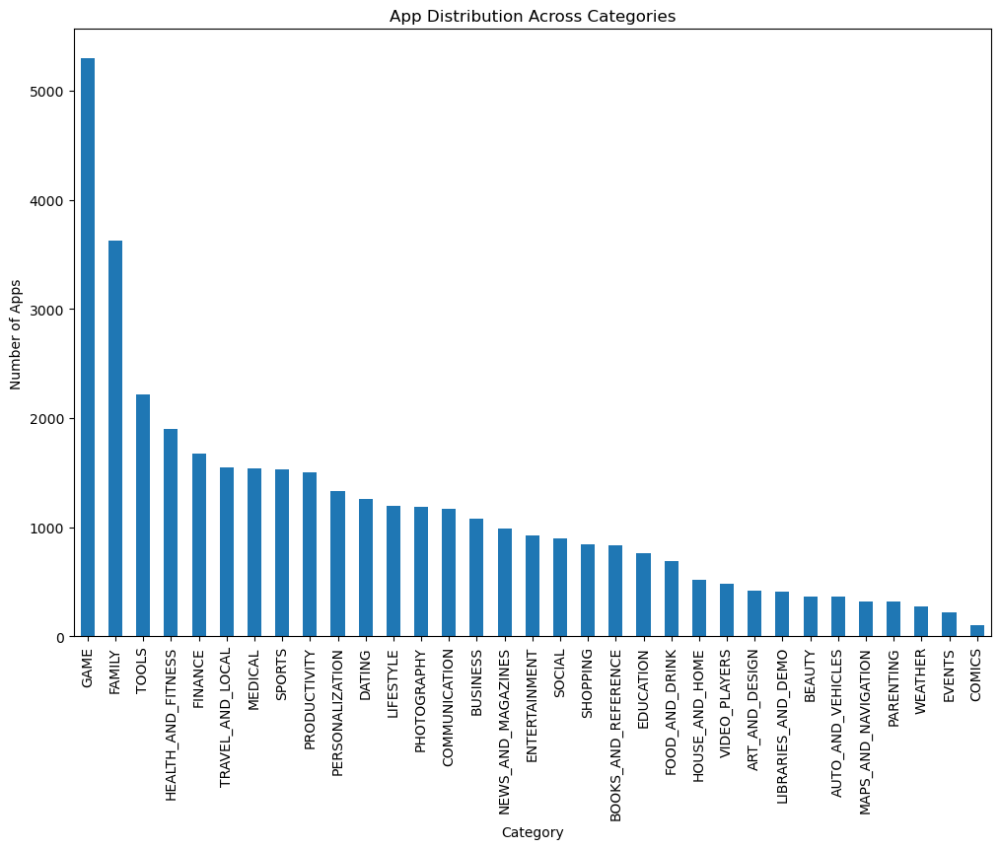

In [227]:
#Category Exploration:Investigate app distribution across categories.
# Count the number of apps in each category
category_distribution = df['Category'].value_counts()

# Print the distribution
print(category_distribution)

# Plot the distribution
plt.figure(figsize=(12, 8))
category_distribution.plot(kind='bar')
plt.title('App Distribution Across Categories')
plt.xlabel('Category')
plt.ylabel('Number of Apps')
plt.xticks(rotation=90)
plt.show()

Key Insights:

1. GAME (5299 apps) and FAMILY (3629 apps) are the top two categories, indicating that entertainment-related apps dominate the market.
2. TOOLS (2220 apps) and HEALTH_AND_FITNESS (1902 apps) are also top categories. This shows a high user interest in utility and wellness apps.
3. Categories like COMICS (102 apps) and EVENTS (219 apps) have far fewer apps, suggesting these are niche markets. And indicating lower user
   demand or untapped opportunities for developers.
4. Categories like FINANCE (1674 apps), TRAVEL_AND_LOCAL (1546 apps), and MEDICAL (1542 apps), have a moderate number of apps. These represent well-
   established but not overcrowded markets, potentially offering balanced opportunities for both new and existing apps.
5. AUTO_AND_VEHICLES (368 apps) and MAPS_AND_NAVIGATION (320 apps) have fewer apps compared to more saturated categories like GAME and FAMILY. These
   areas might offer opportunities for innovation and growth.
6. The high number of apps in the GAME, FAMILY, and TOOLS categories signifies that user demand for entertainment, family-oriented apps, and utility
   tools.
7. PRODUCTIVITY (1504 apps) and COMMUNICATION (1167 apps) apps also show significant activity, reflecting the importance of these in the daily lives of
   users.


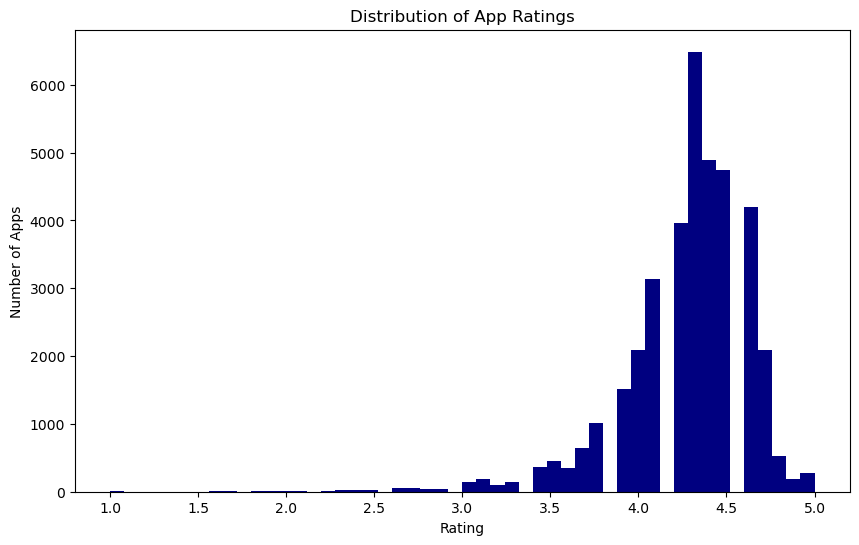

In [228]:
# Ratings Distribution

plt.figure(figsize=(10, 6))
plt.hist(df['Rating'].dropna(), bins=50, color='navy')
plt.title('Distribution of App Ratings')
plt.xlabel('Rating')
plt.ylabel('Number of Apps')
plt.show()

Key Insights:

1. The distribution is heavily skewed towards higher ratings, with the majority of apps having ratings between 4.0 and 4.5. This suggests that most
   apps are rated positively by users.
   
2. The peak of the histogram is around 4.3 to 4.5, indicating that these ratings are the most common.

3. There are very few apps with ratings below 3.0, and almost no apps with ratings below 2.0. This indicates that poorly rated apps are rare, or that
   apps with very low ratings may not stay on the platform for long due to low user engagement.

4. The concentration of ratings between 4.0 and 4.5 might suggest some degree of rating inflation, where users are more likely to give higher ratings,
   or that only apps with better user experiences are successful in maintaining a presence on the platform.

5. After the peak at around 4.5, there’s a noticeable drop in the number of apps with ratings closer to 5.0. This might indicate that it’s challenging
   for apps to maintain a perfect rating, possibly due to the diversity of user expectations.

6. Given the skew towards high ratings, developers should aim to achieve at least a 4.0 rating to remain competitive.
  

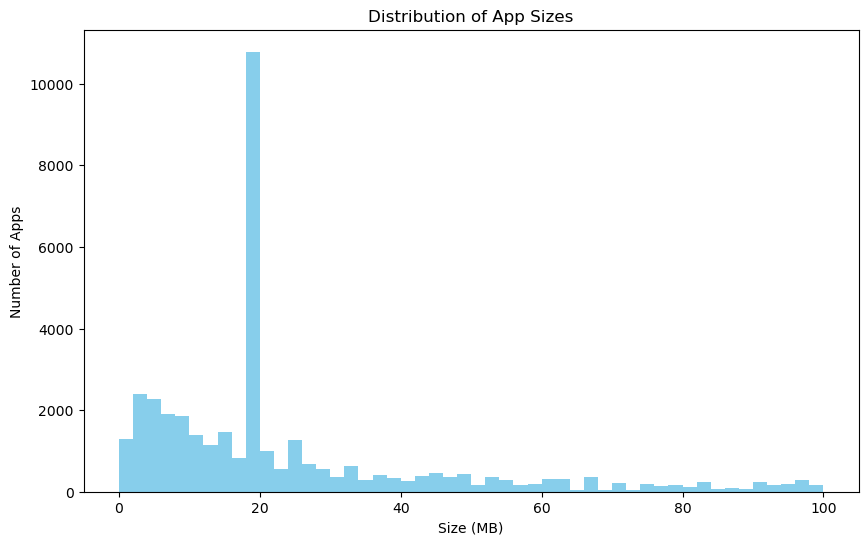

In [229]:
#Size Distribution
plt.figure(figsize=(10, 6))
plt.hist(df['Size'].dropna(), bins=50, color='skyblue')
plt.title('Distribution of App Sizes')
plt.xlabel('Size (MB)')
plt.ylabel('Number of Apps')
plt.show()


Key Insights:

1. There is a significant spike around the 20 MB mark. This indicates that a large number of apps have sizes very close to this value. It suggests that
   20 MB might be a common target size for many developers, possibly due to considerations of download speed, storage constraints, or standard design
   practices.

2. The histogram shows a right-skewed distribution, where the majority of apps are relatively small in size, with most falling below 40 MB. This
   suggests that many apps are optimized to be lightweight, which is crucial for users with limited storage or slower internet connections.

3. There is a long tail of apps with sizes ranging from 20 MB to over 100 MB, but these are much less common. This tail might include more complex apps
   like games, multimedia apps, or apps with extensive offline functionality, which require more storage.

4. Very few apps exceed 60 MB in size, which could indicate that larger apps are either rare or developers make concerted efforts to reduce app size.
   It might also reflect app store policies or user preferences, where larger apps could lead to reduced download rates.

5. Given the concentration of apps around 20 MB, developers should aim to keep their app sizes within this range if possible, especially for markets
   where users may have limited storage or bandwidth.

6. For apps that are inherently larger due to content or functionality (e.g., games or media apps), developers might focus on optimizing content
   delivery (e.g., on-demand downloads) to keep initial download sizes small.

7. In markets where users are sensitive to app size, offering a smaller, more efficient app could be a competitive advantage.

8. For apps that need to be larger due to their functionality, consider targeting markets with higher-end devices or offering lighter versions of the
   app.


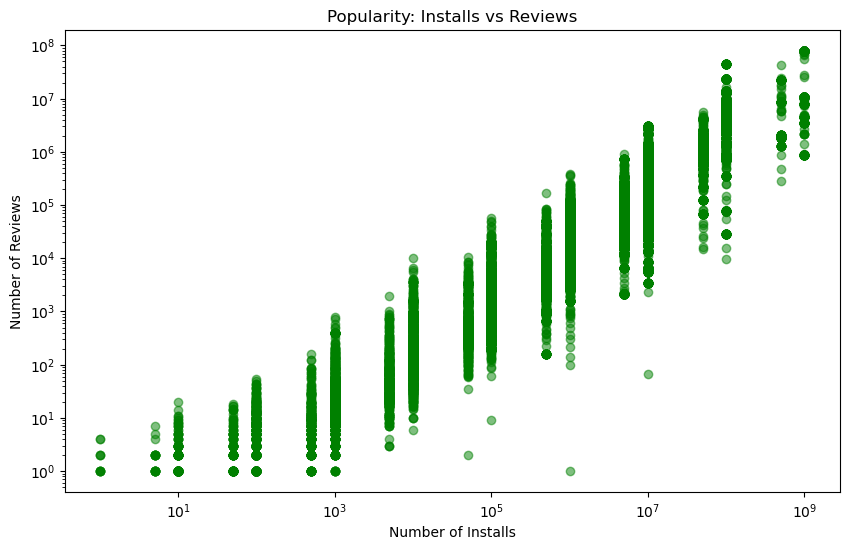

In [252]:
# Installs and Reviews
plt.figure(figsize=(10, 6))
plt.scatter(df['Installs'], df['Reviews'], alpha=0.5, color='green')
plt.title('Popularity: Installs vs Reviews')
plt.xlabel('Number of Installs')
plt.ylabel('Number of Reviews')
plt.xscale('log')
plt.yscale('log')
plt.show()


Key Insights:

1. There is a clear positive correlation between the number of installs and the number of reviews. As the number of installs increases, the number of
   reviews tends to increase as well. This relationship is expected because more users typically lead to more feedback in the form of reviews.

2. The logarithmic scale on both axes helps to spread out the data points, making it easier to observe patterns across different scales. This is
   particularly useful given the large range of values for installs and reviews, spanning several orders of magnitude.

3. The data points form distinct vertical clusters at specific install counts. These clusters likely correspond to typical install milestones (e.g.,
   10, 100, 1,000, etc.), which could be due to how app stores report and round install numbers. For example, many apps have exactly 1,000 installs,
   leading to a vertical line of data points at that value.

5. Within each install cluster, there is significant variance in the number of reviews. For example, among apps with around 1,000 installs, the number
   of reviews can range from just a few to several hundred. This suggests that not all users leave reviews, and other factors—such as app quality,
   engagement prompts, or user experience—affect the likelihood of a user leaving a review.

6. There are a few outliers where apps have a high number of installs but a relatively low number of reviews. These outliers might represent apps that
   are either not encouraging users to leave reviews effectively, or that users do not feel strongly enough about to leave feedback.

7. Given the variability in reviews for apps with similar install counts, developers should actively encourage users to leave reviews. This can be done
   through in-app prompts or incentives.
   
8. Apps with many installs but few reviews might need to assess user engagement strategies. Enhancing user experience or providing incentives could
   increase the number of reviews.

9. Use the correlation between installs and reviews to benchmark app performance. Apps that fall below the trend line might require strategies to boost
   user feedback.


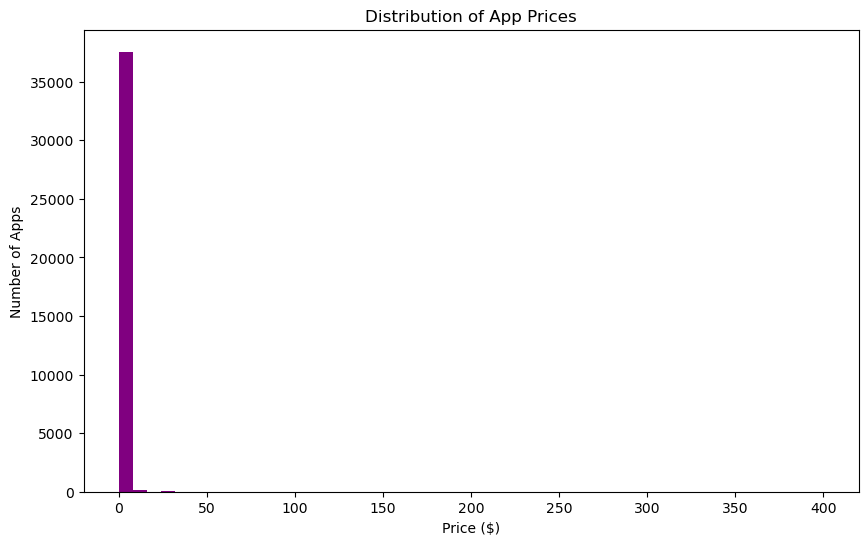

In [253]:
# Price Trends
plt.figure(figsize=(10, 6))
plt.hist(df['Price'].dropna(), bins=50, color='purple')
plt.title('Distribution of App Prices')
plt.xlabel('Price ($)')
plt.ylabel('Number of Apps')
plt.show()

Key Insights:

1. The histogram is heavily skewed towards the left, with a very large spike at $0. This indicates that the vast majority of apps are either free or
   priced very low, which is common in app stores where the freemium model dominates.

2. The concentration at $0 suggests that many developers opt to offer their apps for free, possibly monetizing them through ads, in-app purchases, or
   subscriptions rather than upfront fees.

3. As you move to the right along the x-axis, the number of apps decreases sharply. There are very few apps priced above $50, and almost none in the
   higher price ranges (above $200). This indicates that high-priced apps are rare, which is likely due to the competitive nature of app stores where
   users have a plethora of free or low-cost alternatives.

4. There is a long but sparse tail extending out to prices above $200, indicating that while there are a few high-priced apps, they are extremely rare. 

5. Given the dominance of free apps, developers should consider adopting freemium models, where the app is free to download but generates revenue
   through in-app purchases, subscriptions, or ads.

6. For developers who choose to charge upfront, pricing the app competitively (likely under $10) could be crucial to attract users, as higher prices
   might deter downloads unless the app offers significant value or is targeted at a niche market.

7. If an app is priced higher than average, marketing efforts should focus on clearly communicating the unique value proposition and justifying the
   price to potential users.

8. For free apps, the marketing strategy should focus on driving high download volumes and maximizing revenue through secondary channels like in-app
   purchases or ads.


In [232]:
# Inspect the first few rows of the 'Price' column
print(df['Price'].head())

0    0
1    0
2    0
3    0
4    0
Name: Price, dtype: object


In [239]:
# Get unique values in the 'Price' column
unique_prices = df['Price'].unique()

# Print the unique values
print(unique_prices)

[0.0 4.99 3.99 6.99 1.49 2.99 7.99 5.99 3.49 1.99 9.99 7.49 0.99 9.0 5.49
 10.0 24.99 11.99 79.99 16.99 14.99 1.0 29.99 12.99 2.49 10.99 1.5 19.99
 15.99 33.99 74.99 39.99 3.95 4.49 1.7 8.99 2.0 3.88 25.99 399.99 17.99
 400.0 3.02 1.76 4.84 4.77 1.61 2.5 1.59 6.49 1.29 5.0 13.99 299.99 379.99
 37.99 18.99 389.99 19.9 8.49 1.75 14.0 4.85 46.99 109.99 154.99 3.08 2.59
 4.8 1.96 19.4 3.9 4.59 15.46 3.04 4.29 2.6 3.28 4.6 28.99 2.95 2.9 1.97
 200.0 89.99 2.56 30.99 3.61 394.99 1.26 1.2 1.04]


In [240]:
# Use .loc[] to safely convert the 'Price' column to string
df.loc[:, 'Price'] = df['Price'].astype(str)


In [241]:
# Create a deep copy of the DataFrame to work with
df = df.copy()

In [242]:
# Convert the 'Price' column to string
df.loc[:, 'Price'] = df['Price'].astype(str)

# Remove the dollar sign and any other non-numeric characters
df.loc[:, 'Price'] = df['Price'].str.replace('$', '', regex=False).str.strip()

# Replace empty strings with NaN
df.loc[:, 'Price'] = df['Price'].replace('', pd.NA)

# Convert the 'Price' column to float
df.loc[:, 'Price'] = pd.to_numeric(df['Price'], errors='coerce')


In [243]:
# Check the data type of the 'Price' column
print(df['Price'].dtypes)

object


In [245]:
# Check for non-numeric entries that could not be converted
non_numeric_entries = df['Price'][df['Price'].apply(lambda x: isinstance(x, str))]

# Print any non-numeric entries
print(non_numeric_entries)

Series([], Name: Price, dtype: object)


In [247]:
# Explicitly force the conversion again
df['Price'] = pd.to_numeric(df['Price'], errors='coerce')

# Confirm the data type
print(df['Price'].dtypes)  # Should print 'float64'

float64


In [248]:
#Drop rows with NaN values in the 'Price' column
df.dropna(subset=['Price'], inplace=True)

# Verify again
print(df['Price'].head())
print(df['Price'].dtypes)

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: Price, dtype: float64
float64


In [249]:
# Check for NaN values in the 'Price' column
print(df['Price'].isna().sum())


0


In [250]:
unique_Installs = df['Installs'].unique()

# Print the unique values
print(unique_Installs)

['10,000+' '500,000+' '5,000,000+' '50,000,000+' '100,000+' '50,000+'
 '1,000,000+' '10,000,000+' '5,000+' '100,000,000+' '1,000,000,000+'
 '1,000+' '500,000,000+' '50+' '100+' '500+' '10+' '1+' '5+' '0+' '0']


In [251]:
# Step 1: Remove the plus signs and commas using .loc
df.loc[:, 'Installs'] = df['Installs'].str.replace('+', '', regex=False).str.replace(',', '')

# Step 2: Convert the cleaned strings to float using .loc
df.loc[:, 'Installs'] = df['Installs'].astype(float)

# Verify the conversion
print(df['Installs'].head())
print(df['Installs'].dtypes)  # This should now be 'float64'

0     10000.0
1    500000.0
2    500000.0
3    500000.0
4    500000.0
Name: Installs, dtype: object
object


In [254]:
#Sentiment Analysis: Assess user sentiments through reviews.

In [256]:
from textblob import TextBlob

In [257]:
# Inspect the first few rows
print(df['Translated_Review'].head())

0                                                  NaN
1    A kid's excessive ads. The types ads allowed a...
2                                           It bad >:(
3                                                 like
4                                                  NaN
Name: Translated_Review, dtype: object


In [258]:
def get_sentiment(text):
    blob = TextBlob(text)
    return blob.sentiment.polarity, blob.sentiment.subjectivity

In [259]:
# Apply sentiment analysis only to non-null rows, then assign to those rows
df.loc[df['Translated_Review'].notna(), 'Sentiment_Polarity'], \
df.loc[df['Translated_Review'].notna(), 'Sentiment_Subjectivity'] = zip(*df['Translated_Review'].dropna().apply(get_sentiment))

# Verify the assignment
print(df[['Translated_Review', 'Sentiment_Polarity', 'Sentiment_Subjectivity']].head())


                                   Translated_Review  Sentiment_Polarity  \
0                                                NaN                 NaN   
1  A kid's excessive ads. The types ads allowed a...              -0.250   
2                                         It bad >:(              -0.725   
3                                               like               0.000   
4                                                NaN                 NaN   

   Sentiment_Subjectivity  
0                     NaN  
1                1.000000  
2                0.833333  
3                0.000000  
4                     NaN  


In [260]:
# Replace NaN values in Sentiment_Polarity and Sentiment_Subjectivity with 0 (neutral sentiment)
df['Sentiment_Polarity'].fillna(0, inplace=True)
df['Sentiment_Subjectivity'].fillna(0, inplace=True)

# Verify the changes
print(df[['Translated_Review', 'Sentiment_Polarity', 'Sentiment_Subjectivity']].head())


                                   Translated_Review  Sentiment_Polarity  \
0                                                NaN               0.000   
1  A kid's excessive ads. The types ads allowed a...              -0.250   
2                                         It bad >:(              -0.725   
3                                               like               0.000   
4                                                NaN               0.000   

   Sentiment_Subjectivity  
0                0.000000  
1                1.000000  
2                0.833333  
3                0.000000  
4                0.000000  


In [261]:
# Calculate average sentiment polarity and subjectivity
average_polarity = df['Sentiment_Polarity'].mean()
average_subjectivity = df['Sentiment_Subjectivity'].mean()

print(f"Average Sentiment Polarity: {average_polarity}")
print(f"Average Sentiment Subjectivity: {average_subjectivity}")


Average Sentiment Polarity: 0.140635889125259
Average Sentiment Subjectivity: 0.3677402199863252


1. An average polarity of 0.1406 indicates that the overall sentiment in the reviews is slightly positive. Users tend to have a generally favorable
   view of the apps, though not overwhelmingly so. This slight positivity suggests that most users are generally satisfied with the apps, but there may
   be some room for improvement to increase overall user satisfaction.

2. An average subjectivity of 0.3677 indicates that the reviews are somewhat subjective but still contain a fair amount of objective information. This
   means that users are sharing their personal experiences and opinions, but they are also likely providing factual feedback about the app’s
   performance or features. The relatively low subjectivity score suggests that many reviews are balanced, containing a mix of personal opinion and
   factual information. This type of feedback can be particularly useful for developers to understand both how users feel and what specific issues or
   features they mention.

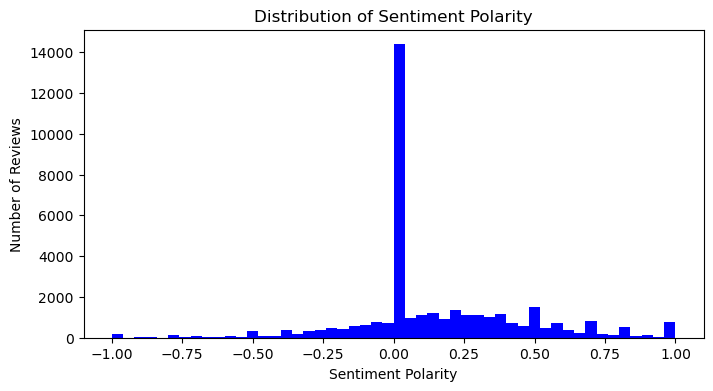

In [268]:
# Histogram of sentiment polarity
plt.figure(figsize=(8, 4))
plt.hist(df['Sentiment_Polarity'].dropna(), bins=50, color='blue')
plt.title('Distribution of Sentiment Polarity')
plt.xlabel('Sentiment Polarity')
plt.ylabel('Number of Reviews')
plt.show()


Key Insights:

1. There is a significant spike at a sentiment polarity of 0, indicating that a large number of reviews are neutral. This could mean that users are
   leaving reviews that are neither particularly positive nor negative, or it might suggest that the content of the reviews does not express strong
    emotions.

2. The distribution shows a right-skew, with more reviews having positive sentiment (greater than 0) compared to negative sentiment (less than 0).This
   skew indicates that, on average, users tend to leave more positive reviews than negative ones. This is consistent with the average sentiment
   polarity of 0.1406 that was previously calculated.

3. There are relatively few reviews with strongly negative sentiment (close to -1). This suggests that while some users do express dissatisfaction, it
   is not as common as neutral or slightly positive feedback. The small number of very negative reviews might also indicate that most apps in the
   dataset manage to avoid extremely poor user experiences.

4. The distribution shows a fair amount of reviews with moderate positive sentiment (between 0.25 and 0.5), which suggests that while users are
   generally positive, they are not overwhelmingly so. This aligns with the idea that many users find the apps satisfactory but may still have some
   reservations.

5. Given the high number of neutral reviews, developers should consider engaging with users to understand what might be lacking in the app experience.
   Neutral feedback can be an opportunity to convert users into more satisfied, loyal customers.

6. The positive skew is a good sign, but developers should still strive to enhance the app experience to push more reviews into the strongly positive
   range (above 0.5).

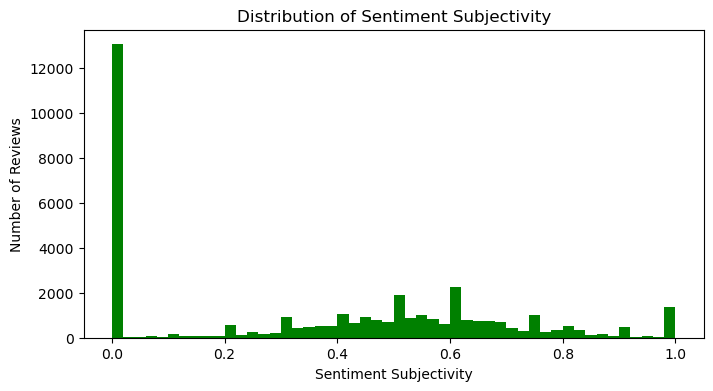

In [269]:
# Histogram of sentiment subjectivity
plt.figure(figsize=(8, 4))
plt.hist(df['Sentiment_Subjectivity'].dropna(), bins=50, color='green')
plt.title('Distribution of Sentiment Subjectivity')
plt.xlabel('Sentiment Subjectivity')
plt.ylabel('Number of Reviews')
plt.show()


Key Insights:

1. There is a significant spike at a subjectivity score of 0, indicating that a large number of reviews are completely objective. These reviews likely
   contain factual statements without much personal opinion or emotional language. This could suggest that many users are providing straightforward,
   factual feedback about the apps without expressing strong personal feelings.

2. Outside of the spike at 0, the distribution of subjectivity is relatively even across the range from 0 to 1. This indicates that the reviews vary
   widely in how subjective they are, with some being very subjective (close to 1.0) and others being more balanced or mixed in terms of personal
   opinion versus objective statements.

3. There are smaller spikes around 0.5 and 1.0. These spikes suggest that a notable number of reviews are either balanced in their subjectivity (mixing
   objective facts with personal opinions) or entirely subjective (based mostly on the user’s personal feelings or experiences).

4. The large number of objective reviews (subjectivity near 0) can provide developers with clear, actionable feedback based on factual user
   experiences. This can be particularly useful for identifying bugs, usability issues, or specific feature requests.

5. Reviews with higher subjectivity scores may offer insights into user satisfaction or dissatisfaction. Developers should consider these reviews when
   making decisions about user experience improvements or feature updates.

6. The varied distribution of subjectivity suggests that product managers should balance insights gained from both objective and subjective reviews.
   Objective reviews might highlight technical issues, while subjective reviews could offer insights into user sentiment and brand perception.

7. The objective reviews could be particularly valuable for quality assurance processes, helping to identify and address specific issues that users
   have encountered.

In [263]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


In [264]:
import plotly.express as px

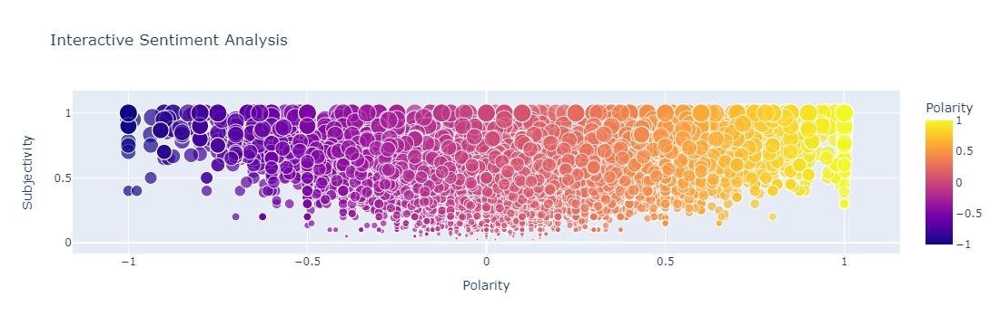

In [265]:
# Create a scatter plot with Plotly
fig = px.scatter(df, 
                 x='Sentiment_Polarity', 
                 y='Sentiment_Subjectivity', 
                 color='Sentiment_Polarity',
                 size='Sentiment_Subjectivity',  # Optional: make the size of points reflect subjectivity
                 title='Interactive Sentiment Analysis',
                 hover_name='Translated_Review',  # Display review text on hover
                 labels={
                     'Sentiment_Polarity': 'Polarity',
                     'Sentiment_Subjectivity': 'Subjectivity'
                 })

# Show the plot
fig.show()

Key Insights:

1. There is a wide spread of sentiment polarity across the range, with a notable concentration around 0 (neutral). This indicates that many reviews are
   neutral or slightly positive, which aligns with the previously observed average sentiment polarity of 0.1406.The color gradient from purple
   (negative) to yellow (positive) visually emphasizes the distribution of sentiment, showing that while there are negative reviews, they are less
   frequent compared to neutral and positive ones.

2. There is a dense cluster of reviews with high subjectivity (close to 1), indicating that many reviews are based on personal opinions or experiences.
   However, there is also a significant number of reviews with lower subjectivity, suggesting a mix of objective and subjective content. The vertical
   spread of bubbles at each polarity value suggests that both subjective and objective reviews can have a wide range of sentiment polarities.

3. The plot does not show a strong correlation between polarity and subjectivity. Reviews with high subjectivity can be found across the entire
   polarity spectrum, from very negative to very positive.Similarly, more objective reviews (lower subjectivity) also span across different sentiment
   polarities, indicating that even factual reviews can carry varying emotional tones.

4. There is a noticeable cluster of bubbles around neutral polarity (0) and high subjectivity (close to 1). This could represent reviews where users
   express personal opinions without a strong positive or negative bias.The distribution also shows a tapering of bubbles as polarity becomes more
   extreme (towards -1 or 1), suggesting fewer reviews are strongly negative or strongly positive.

5. The variety in subjectivity and polarity suggests that developers should consider both objective and subjective feedback when making decisions.
   Objective reviews might highlight specific issues, while subjective ones can reveal user sentiment and satisfaction.

6. Since many reviews cluster around neutral to slightly positive polarity, developers might focus on features or improvements that could shift these
   reviews further into the positive range.

7. The distribution indicates a diverse range of feedback. Product managers should analyze both ends of the spectrum to understand where the app excels
   and where it might need improvement.

8. Encouraging users who are already positive or neutral to leave more detailed feedback could help increase the richness of data and provide deeper
   insights into user needs.

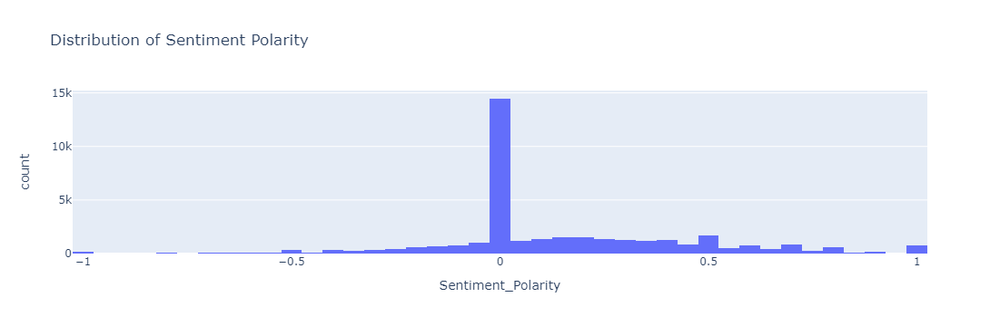

In [266]:
fig = px.histogram(df, 
                   x='Sentiment_Polarity',
                   title='Distribution of Sentiment Polarity',
                   nbins=50)
fig.show()


Key Insights:

1. There is a significant spike at a sentiment polarity of 0, indicating that a large number of reviews are neutral. This suggests that many users are
   leaving feedback that is neither particularly positive nor negative. The dominance of neutral sentiment might indicate that users are more likely to
   leave factual, non-emotional feedback, or that the content of the reviews does not express strong positive or negative opinions.

2. Outside of the neutral sentiment, the histogram shows a slight positive skew, meaning there are more positive reviews (polarity > 0) than negative
   ones (polarity < 0). This skew suggests that, overall, users tend to have a more favorable view of the apps, aligning with the average sentiment
   polarity previously noted as 0.1406.

3. There are relatively few reviews with strongly negative sentiment (close to -1). This indicates that while some users express dissatisfaction, it is
   not common for reviews to be very negative. The scarcity of strongly negative reviews might reflect a generally positive user experience with most
   apps in the dataset.

4. The histogram shows a longer tail towards the positive side, with some reviews approaching a sentiment polarity of 1. This indicates that while less
   frequent, there are reviews that are very positive, reflecting strong user satisfaction.

5. Given the positive skew, developers should continue to build on what is working well to further push reviews into the more positive range.

6. Since a large portion of reviews is neutral, there is an opportunity to engage with these users to understand what might improve their experience
   and convert neutral feedback into positive feedback.

7. The predominance of neutral and slightly positive feedback suggests a stable user base. However, it's important to monitor these reviews for
   emerging issues that could push sentiment toward the negative.

8. Even though negative reviews are fewer, they should be closely analyzed to identify and rectify potential problems before they impact a larger
   segment of users.

9. The positive skew can be highlighted in marketing campaigns, showcasing user satisfaction. Testimonials from the more positive end of the spectrum
   could be used to attract new users.

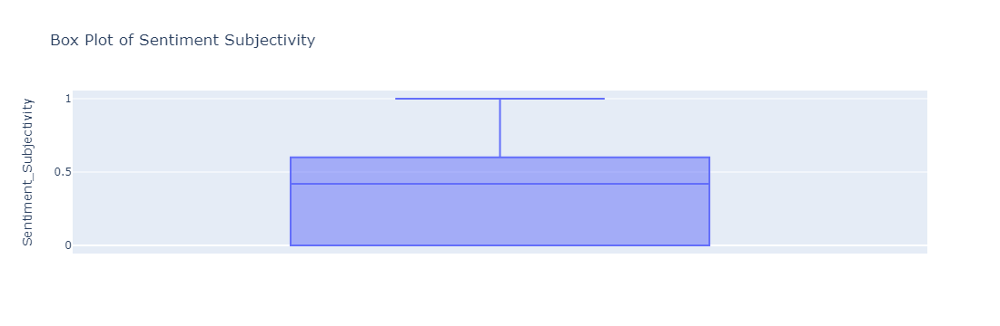

In [267]:
fig = px.box(df, 
             y='Sentiment_Subjectivity',
             title='Box Plot of Sentiment Subjectivity')
fig.show()


Key Insights:

1. The median (the line inside the box) is around 0.5. This suggests that, on average, reviews are moderately subjective, meaning they contain a mix of
   personal opinions and factual information.

2. The box represents the interquartile range (IQR), which covers the middle 50% of the data. The IQR for sentiment subjectivity appears to range from
   approximately 0.2 to 0.7. This indicates that the majority of reviews fall within this range, showing variability in the degree of subjectivity but
   generally leaning towards a mix of objective and subjective content. The fact that the IQR is quite broad suggests that there is significant
   variation in how users express their sentiments, with some reviews being more objective and others being more subjective.

3. The whiskers extend to the minimum and maximum values of sentiment subjectivity, which range from 0 (completely objective) to 1 (completely
   subjective). There don’t appear to be significant outliers, suggesting that the distribution of subjectivity is relatively smooth across its range.
   The full range of subjectivity from 0 to 1 shows that reviews can be purely objective or entirely subjective, depending on the user's perspective or
   the nature of the feedback.

4. The median subjectivity around 0.5 suggests that developers can expect a balanced mix of objective and subjective feedback. This is beneficial for
   making informed decisions, as it allows developers to consider both concrete issues and user sentiments when planning updates or improvements.

5. Developers might want to focus on reviews that are either highly subjective or highly objective, depending on whether they are looking to understand
   user feelings (subjective) or identify specific technical issues (objective).

6. The broad IQR indicates that user reviews vary widely in subjectivity. Product managers should consider this variability when analyzing user
   feedback, ensuring that both emotional responses and factual comments are considered in decision-making.
   
7. Reviews that fall within the median and IQR could be prioritized for understanding general user sentiment, while more extreme values might highlight
   particularly strong opinions or critical issues.

8. Reviews that are more subjective could be used in marketing materials to showcase personal user stories and testimonials, which can be powerful in
   attracting new users.
   
9. Objective reviews might be more factual and can be used to reassure potential users about the app’s reliability and effectiveness.

END